In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))



<img src="profile_manoelgadi.png" width=100 height=100 align="right">

Author: Prof. Manoel Gadi

Contact: mfalonso@faculty.ie.edu

To compete in this challenge, please create an user at my teaching website: http://mfalonso.pythonanywhere.com

Last revision: 09/March/2020

**Allison  Katherine Black**

---

## Fraud detection game starting code...


### Importing libraries and datasets

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

### Development sample

In [14]:
print ("LOADING DATASETS...")
df = pd.read_csv("dev.csv") 
# use at beginning for training and to check models

LOADING DATASETS...


In [4]:
df.head()

,id,ib_var_1,ib_var_2,ib_var_3,ib_var_4,ib_var_5,ib_var_6,ib_var_7,ib_var_8,ib_var_9,...,if_var_73,if_var_74,if_var_75,if_var_76,if_var_77,if_var_78,if_var_79,if_var_80,if_var_81,ob_target
0,1,0,1,0,0,1,1,0,0,0,...,0.800,0,6,5,0.500000,9.4634,5140.0,0.766667,1,0
1,2,0,1,0,0,0,1,0,0,0,...,0.925,5,8,5,0.400000,7.6341,2570.0,0.700000,4,0
2,3,0,0,0,0,1,1,0,0,0,...,0.800,3,10,6,0.700000,11.1707,5140.0,0.666667,2,0
3,4,0,1,0,1,1,1,0,0,0,...,0.825,5,5,6,0.433333,8.0488,1028.0,0.766667,3,0
4,5,0,0,0,0,0,1,0,0,0,...,0.800,0,11,5,0.700000,5.5854,5140.0,0.733333,3,0


### Out-of-time sample

In [15]:
dfo = pd.read_csv("oot0.csv")
# check when training is done 

In [6]:
dfo.head()

,id,ib_var_1,ib_var_2,ib_var_3,ib_var_4,ib_var_5,ib_var_6,ib_var_7,ib_var_8,ib_var_9,...,if_var_72,if_var_73,if_var_74,if_var_75,if_var_76,if_var_77,if_var_78,if_var_79,if_var_80,if_var_81
0,1,0,1,0,0,1,0,0,0,0,...,5,0.775,1.0,10.0,11.0,0.666667,NaN,5140.000000,0.666667,3
1,2,1,0,0,0,1,1,0,0,0,...,6,0.750,0.0,8.0,10.0,0.600000,12.9024,5140.000000,0.733333,0
2,3,0,0,0,0,1,1,0,0,0,...,7,0.725,0.0,8.0,6.0,0.700000,NaN,2570.000000,0.766667,1
3,4,0,1,0,1,1,1,0,0,0,...,4,0.925,2.0,7.0,5.0,0.566667,15.5366,2056.000000,0.833333,0
4,5,1,0,0,1,1,1,0,0,0,...,5,0.925,0.0,10.0,7.0,0.333333,17.8293,4728.799805,0.633333,2


## Identifying the types of the variables:

* id is a primary key auto incremental
*  ib_var_1 is input binary - flag 0/1 variable
*  ib_var_2 is input binary - flag 0/1 variable
*  ib_var_3 is input binary - flag 0/1 variable
*  ib_var_4 is input binary - flag 0/1 variable
*  ib_var_5 is input binary - flag 0/1 variable
*  ib_var_6 is input binary - flag 0/1 variable
*  ib_var_7 is input binary - flag 0/1 variable
*  ib_var_8 is input binary - flag 0/1 variable
*  ib_var_9 is input binary - flag 0/1 variable
*  ib_var_10 is input binary - flag 0/1 variable
*  ib_var_11 is input binary - flag 0/1 variable
*  ib_var_12 is input binary - flag 0/1 variable
*  ib_var_13 is input binary - flag 0/1 variable
*  ib_var_14 is input binary - flag 0/1 variable
*  ib_var_15 is input binary - flag 0/1 variable
*  ib_var_16 is input binary - flag 0/1 variable
*  ib_var_17 is input binary - flag 0/1 variable
*  ib_var_18 is input binary - flag 0/1 variable
*  ib_var_19 is input binary - flag 0/1 variable
*  ib_var_20 is input binary - flag 0/1 variable
*  ib_var_21 is input binary - flag 0/1 variable
*  icn_var_22 is input categorical nominal
*  icn_var_23 is input categorical nominal
*  icn_var_24 is input categorical nominal
*  ico_var_25 is input categorical ordinal
*  ico_var_26 is input categorical ordinal
*  ico_var_27 is input categorical ordinal
*  ico_var_28 is input categorical ordinal
*  ico_var_29 is input categorical ordinal
*  ico_var_30 is input categorical ordinal
*  ico_var_31 is input categorical ordinal
*  ico_var_32 is input categorical ordinal
*  ico_var_33 is input categorical ordinal
*  ico_var_34 is input categorical ordinal
*  ico_var_35 is input categorical ordinal
*  ico_var_36 is input categorical ordinal
*  ico_var_37 is input categorical ordinal
*  ico_var_38 is input categorical ordinal
*  ico_var_39 is input categorical ordinal
*  ico_var_40 is input categorical ordinal
*  ico_var_41 is input categorical ordinal
*  ico_var_42 is input categorical ordinal
*  ico_var_43 is input categorical ordinal
*  ico_var_44 is input categorical ordinal
*  ico_var_45 is input categorical ordinal
*  ico_var_46 is input categorical ordinal
*  ico_var_47 is input categorical ordinal
*  ico_var_48 is input categorical ordinal
*  ico_var_49 is input categorical ordinal
*  ico_var_50 is input categorical ordinal
*  ico_var_51 is input categorical ordinal
*  ico_var_52 is input categorical ordinal
*  ico_var_53 is input categorical ordinal
*  ico_var_54 is input categorical ordinal
*  ico_var_55 is input categorical ordinal
*  ico_var_56 is input categorical ordinal
*  ico_var_57 is input categorical ordinal
*  ico_var_58 is input categorical ordinal
*  ico_var_59 is input categorical ordinal
*  ico_var_60 is input categorical ordinal
*  ico_var_61 is input categorical ordinal
*  ico_var_62 is input categorical ordinal
*  ico_var_63 is input categorical ordinal
*  ico_var_64 is input categorical ordinal
*  if_var_65 is input numerical continuos (input float)
*  if_var_66 is input numerical continuos (input float)
*  if_var_67 is input numerical continuos (input float)
*  if_var_68 is input numerical continuos (input float)
*  if_var_69 is input numerical continuos (input float)
*  if_var_70 is input numerical continuos (input float)
*  if_var_71 is input numerical continuos (input float)
*  if_var_72 is input numerical continuos (input float)
*  if_var_73 is input numerical continuos (input float)
*  if_var_74 is input numerical continuos (input float)
*  if_var_75 is input numerical continuos (input float)
*  if_var_76 is input numerical continuos (input float)
*  if_var_77 is input numerical continuos (input float)
*  if_var_78 is input numerical continuos (input float)
*  if_var_79 is input numerical continuos (input float)
*  if_var_80 is input numerical continuos (input float)
*  if_var_81 is input numerical continuos (input float)
*  ob_target is output binary (target variable: 1 meaning fraud case and 0 non-fraud case)

In [16]:
print ("STEP 1: DOING MY TRANSFORMATIONS...")
df = df.fillna(0)
dfo = dfo.fillna(0)

STEP 1: DOING MY TRANSFORMATIONS...


In [7]:
# produce a heat map of the dataframe (df)
df.style.background_gradient(cmap ='viridis').set_properties(**{'font-size': '10px'}) 

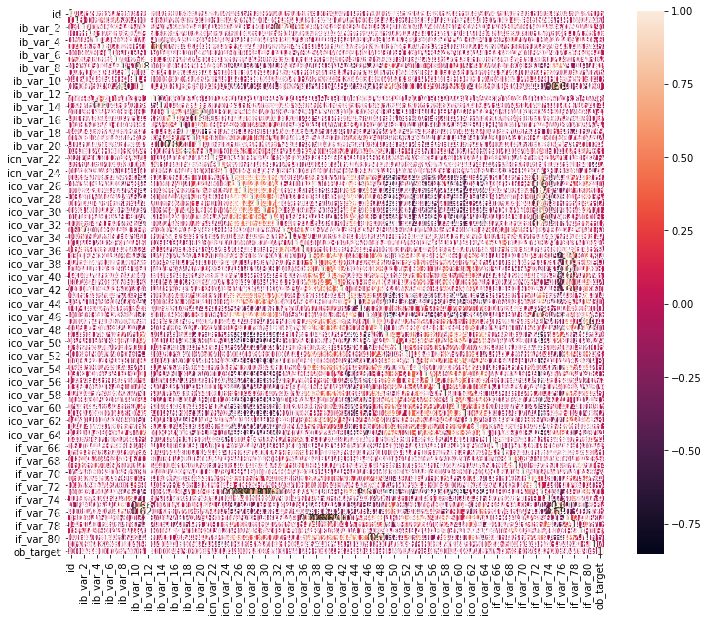

In [9]:
# produce a heatmap showing correlation 
plt.figure(figsize=(12,10))
cor = df.corr()
sns.heatmap(cor, annot=True)
plt.show()

In [17]:
print ("STEP 2: SELECTING CHARACTERISTICS TO ENTER INTO THE MODEL...")

# in_model = list_inputs #['ib_var_1','icn_var_22','ico_var_25','if_var_65']
in_model = df.drop(columns=['ob_target'])
output_var = 'ob_target'

STEP 2: SELECTING CHARACTERISTICS TO ENTER INTO THE MODEL...


In [18]:
print ("STEP 3: DEVELOPING THE MODEL...")

X = in_model
y = df[output_var]
Xo = dfo

STEP 3: DEVELOPING THE MODEL...


In [19]:
from imblearn.over_sampling import RandomOverSampler
sampler = RandomOverSampler(random_state=0)
X_rs, y_rs = sampler.fit_sample(X, y)

In [20]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_estimators=450)
fitted_model = clf.fit(X_rs, y_rs)
pred_dev = fitted_model.predict_proba(X_rs)[:,1]
pred_oot = fitted_model.predict_proba(Xo)[:,1]

In [21]:
# checking out value error from step 4 - find shapes 
print("X shape:", X.shape)
print("y shape:", y.shape)
print("pred_dev shape:", pred_dev.shape)

X shape: (864, 82)
y shape: (864,)
pred_dev shape: (1552,)


In [23]:
print ("STEP 4: ASSESSING THE MODEL...")
# CALCULATING GINI PERFORMANCE ON DEVELOPMENT SAMPLE
from sklearn.metrics import roc_auc_score
gini_score = 2*roc_auc_score(y_rs, pred_dev)-1
print ("GINI DEVELOPMENT=", gini_score)

def KS(b,a):  
    """Function that received two parameters; first: a binary variable representing 0=good and 1=bad, 
    and then a second variable with the prediction of the first variable, the second variable can be continuous, 
    integer or binary - continuous is better. Finally, the function returns the KS Statistics of the two lists."""
    try:
        tot_bads=1.0*sum(b)
        tot_goods=1.0*(len(b)-tot_bads)
        elements = zip(*[a,b])
        elements = sorted(elements,key= lambda x: x[0])
        elements_df = pd.DataFrame({'probability': b,'gbi': a})
        pivot_elements_df = pd.pivot_table(elements_df, values='probability', index=['gbi'], aggfunc=[sum,len]).fillna(0)
        max_ks = perc_goods = perc_bads = cum_perc_bads = cum_perc_goods = 0
        for i in range(len(pivot_elements_df)):
            perc_goods =  (pivot_elements_df.iloc[i]['len'] - pivot_elements_df.iloc[i]['sum']) / tot_goods
            perc_bads = pivot_elements_df.iloc[i]['sum']/ tot_bads
            cum_perc_goods += perc_goods
            cum_perc_bads += perc_bads
            A = cum_perc_bads-cum_perc_goods
            if abs(A['probability']) > max_ks:
                max_ks = abs(A['probability'])
    except:
        max_ks = 0
    return max_ks


KS_score = KS(y,pred_dev)
print ("KS DEVELOPMENT=", KS_score) 

STEP 4: ASSESSING THE MODEL...
GINI DEVELOPMENT= 1.0
KS DEVELOPMENT= 0


What is GINI and KS?
* watch this video for reference: https://youtu.be/MiBUBVUC8kE

In [24]:
print ("STEP 5: SUBMITTING THE RESULTS...")
import requests
from requests.auth import HTTPBasicAuth
dfo['pred'] = pred_oot
dfo_tosend = dfo[list(['id','pred'])]

i=1
filename = "student_sub"+str(i)+".csv"
dfo_tosend.to_csv(filename, sep=',')

url = 'http://mfalonso.pythonanywhere.com/api/v1.0/uploadpredictions'

STEP 5: SUBMITTING THE RESULTS...


To compete in this challenge, please create an user at my teaching website: http://mfalonso.pythonanywhere.com
and replace below where it says:
* my_user_name_goes_here
* my_password_goes_here

In [25]:
files = {'file': (filename, open(filename, 'rb'))}
rsub = requests.post(url, files=files, auth=HTTPBasicAuth('a.black', 'ys2P#oLL6^U#%n'))

resp_str = str(rsub.text)
print ("RESULT SUBMISSION: ", resp_str)

RESULT SUBMISSION:  KS2 = 0.383858677067; GINI = 0.515590486049; GRADE = 9.096


In [ ]:
# final submission: copy of csv with best result
# make a copy of student_sub each time because it will be overwritten! 